In [1]:
import sys
sys.path.append("../scripts")
from TorchDataset import TimeSeriesDataset
from Models import VanillaLSTM, VanillaRNN, VanillaGRU
from Saving_and_Paths import get_experiment_path

In [2]:
import os
import numpy as np
import pandas as pd
import torch
from torch import nn
import json
import matplotlib.pyplot as plt
import pickle

In [63]:
DEVICE = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
NUM_EPOCHS = 2
BATCH_SIZE = 64
HIDDEN_SIZE = 32
NUM_LAYERS = 1
DROPOUT_RATE = 0.0
LEARNING_RATE = 1e-3

OPTUNA_TRIALS = 2  # nº experimentos a probar con Optuna

VALIDATION_DIR = "../experiments/validation"
TEST_PREDICTIONS_DIR = "../test_predictions"    

INPUT_SIZE = 1
OUTPUT_SIZE = 1
WINDOW_INPUT_LENGTH = 24
WINDOW_OUTPUT_LENGTH = 1

In [4]:
model_classes = {
    "lstm": VanillaLSTM,
    "gru": VanillaGRU,
    "rnn": VanillaRNN
}

In [5]:
models = {}
parkings = [i for i in os.listdir(VALIDATION_DIR) if i.startswith("parking_")]
for pid in parkings:
    for arch_name in ["rnn", "lstm", "gru"]:
        model_class = model_classes[arch_name]
        for tipo in ["vanilla", "optuna"]:

            #cargar modelo 
            model_path = os.path.join(VALIDATION_DIR, pid, arch_name, tipo, "best_model.pt")
            if not os.path.exists(model_path):
                print(f"⚠️ No se encontró el modelo en {model_path}. Saltando...\n")
                continue

            #version optuna
            if tipo == "optuna":
                best_params_path = os.path.join(VALIDATION_DIR, pid, arch_name, tipo, "best_params.json")
                with open(best_params_path, "r") as f:
                    best_params = json.load(f)


                model = model_class(
                    input_size=INPUT_SIZE,
                    hidden_size=best_params["hidden_size"],
                    output_size=OUTPUT_SIZE,
                    num_layers=best_params["num_layers"]
                )
            
            #version vanill
            else:
                model = model_class(
                    input_size=INPUT_SIZE,
                    hidden_size=HIDDEN_SIZE,
                    output_size=OUTPUT_SIZE,
                    num_layers=NUM_LAYERS
                )
            model.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model.to(DEVICE)
            
            # Guardar modelo con nombre identificativo
            model_name = f"{pid}_{arch_name}_{tipo}"
            models[model_name] = model

In [6]:
models

{'parking_6_rnn_vanilla': VanillaRNN(
   (embedding_mes): Embedding(12, 2)
   (embedding_weekday): Embedding(7, 2)
   (blocks): ModuleList(
     (0): RNN(1, 32, batch_first=True)
   )
   (fc): Linear(in_features=37, out_features=1, bias=True)
 ),
 'parking_6_rnn_optuna': VanillaRNN(
   (embedding_mes): Embedding(12, 2)
   (embedding_weekday): Embedding(7, 2)
   (blocks): ModuleList(
     (0): RNN(1, 16, batch_first=True)
     (1): Dropout(p=0.0, inplace=False)
     (2): RNN(16, 8, batch_first=True)
     (3): Dropout(p=0.0, inplace=False)
     (4): RNN(8, 4, batch_first=True)
   )
   (fc): Linear(in_features=9, out_features=1, bias=True)
 ),
 'parking_6_lstm_vanilla': VanillaLSTM(
   (embedding_mes): Embedding(12, 2)
   (embedding_weekday): Embedding(7, 2)
   (blocks): ModuleList(
     (0): LSTM(1, 32, batch_first=True)
   )
   (fc): Linear(in_features=37, out_features=1, bias=True)
 ),
 'parking_6_lstm_optuna': VanillaLSTM(
   (embedding_mes): Embedding(12, 2)
   (embedding_weekday): E

# Load data

In [8]:
with open("../data/data_for_subrogated/train.pkl", "rb") as f:
    train = pickle.load(f)

with open("../data/data_for_subrogated/val.pkl", "rb") as f:
    val = pickle.load(f)

with open("../data/data_for_subrogated/test.pkl", "rb") as f:
    test = pickle.load(f)

# Visualize embedddings

## Month embeddings

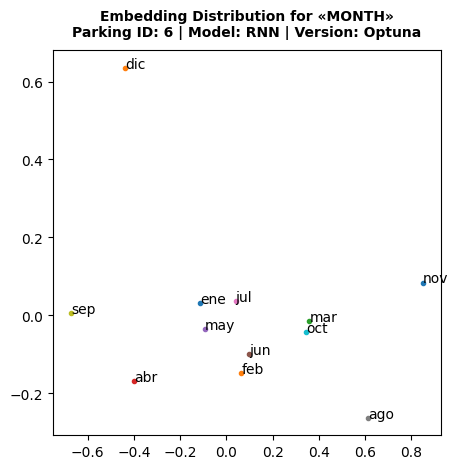

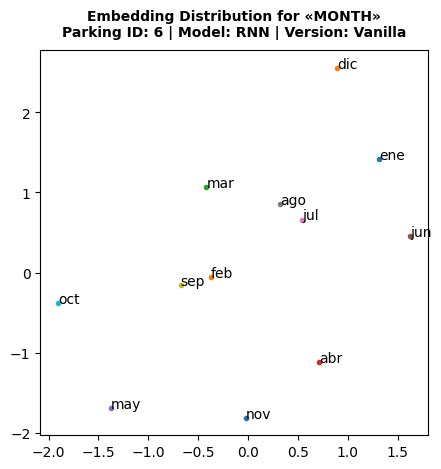

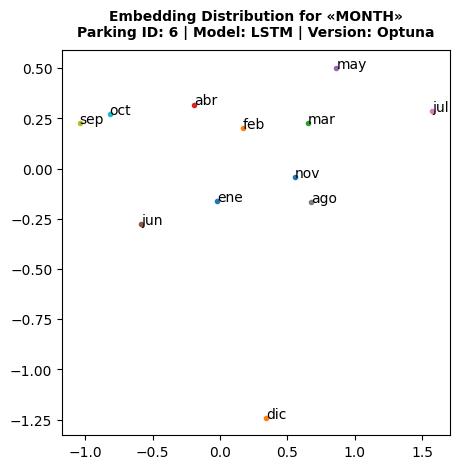

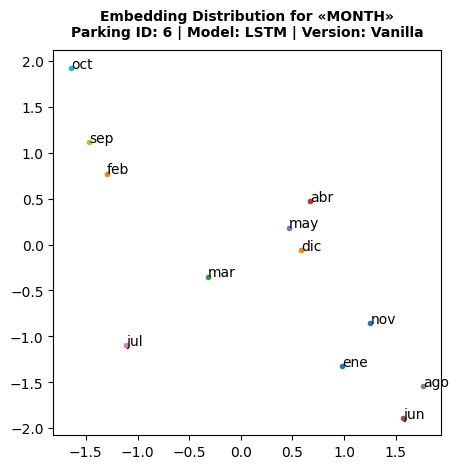

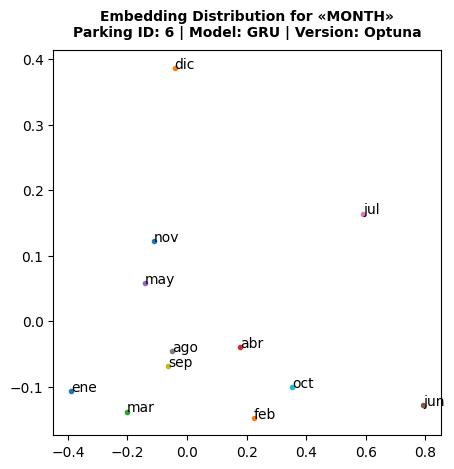

...

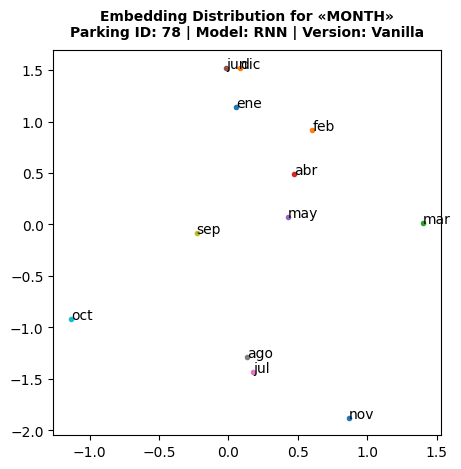

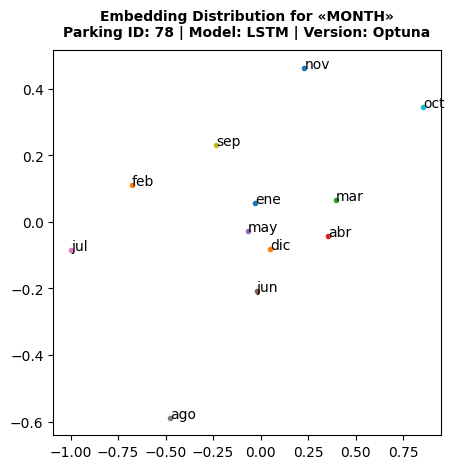

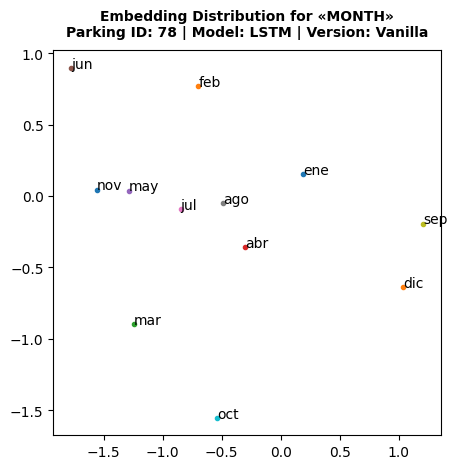

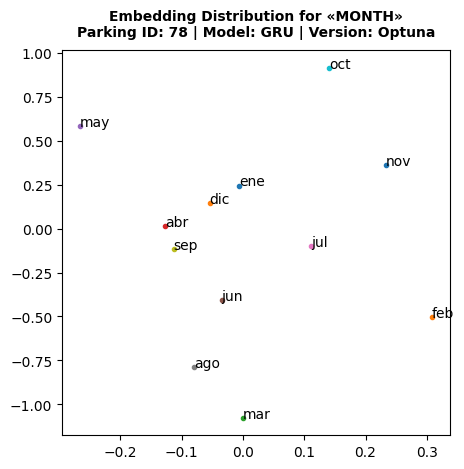

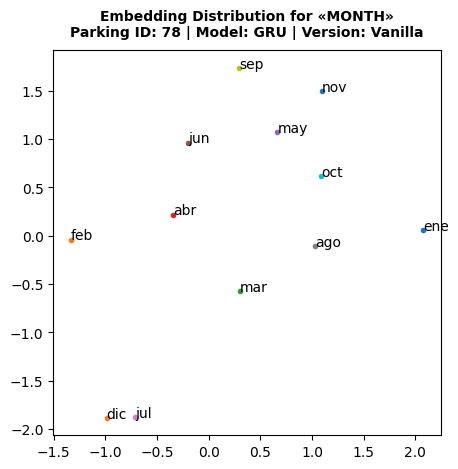

In [18]:
nombres_meses = ["ene", "feb", "mar", "abr", "may", "jun", "jul", "ago", "sep", "oct", "nov", "dic"]
for pid in list(train.keys()):
    for arch_name in ["rnn", "lstm", "gru"]:
        for tipo in ["optuna", "vanilla"]:
            model_name = f"parking_{pid}_{arch_name}_{tipo}"
            embedding_mes = models[model_name].embedding_mes.weight
            plt.figure(figsize=(5,5))
            for i in range(12):
                plt.plot(embedding_mes[i,0].cpu().detach().numpy(), embedding_mes[i,1].cpu().detach().numpy(), ".")
                plt.text(embedding_mes[i,0].cpu().detach().numpy(), embedding_mes[i,1].cpu().detach().numpy(), nombres_meses[i])
                title_str = (
                    f"Embedding Distribution for «MONTH»\n"
                    f"Parking ID: {pid} | Model: {arch_name.upper()} | Version: {tipo.title()}"
                )
                plt.title(title_str, fontsize = 10, fontweight='bold', pad = 10)
            plt.show()

In [ ]:
model.embedding_weekday

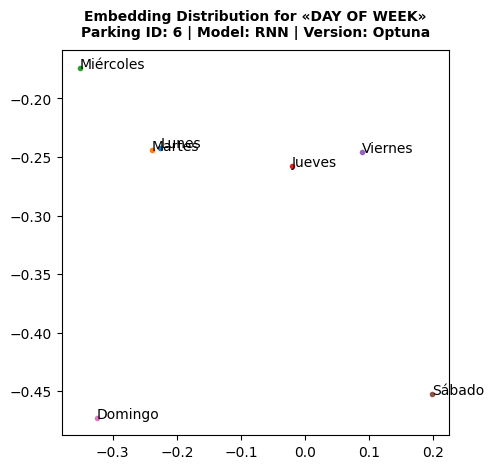

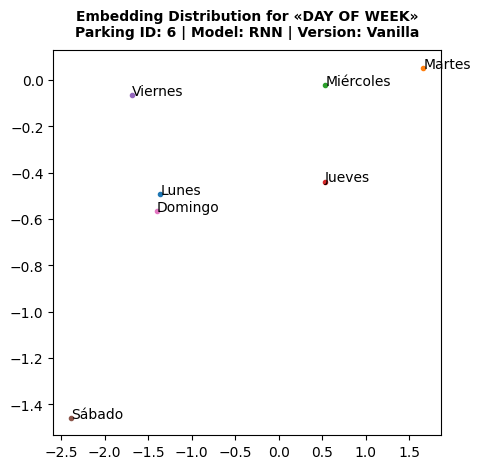

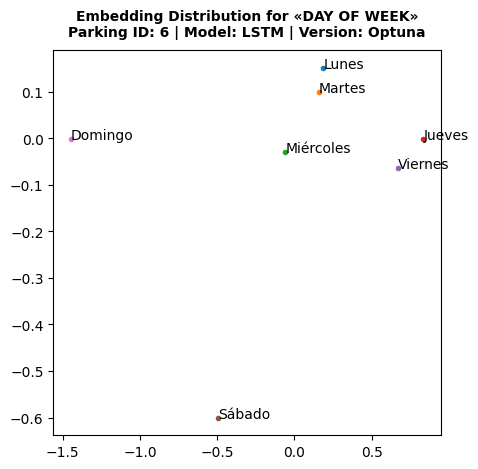

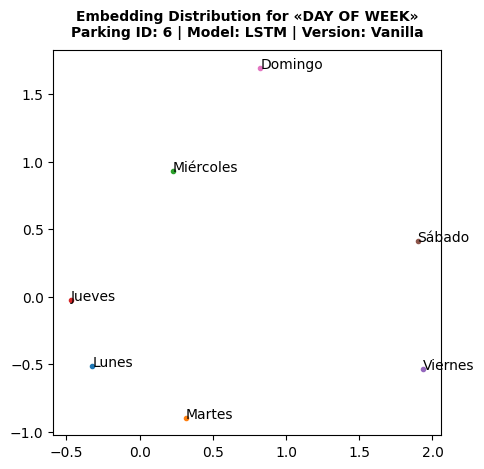

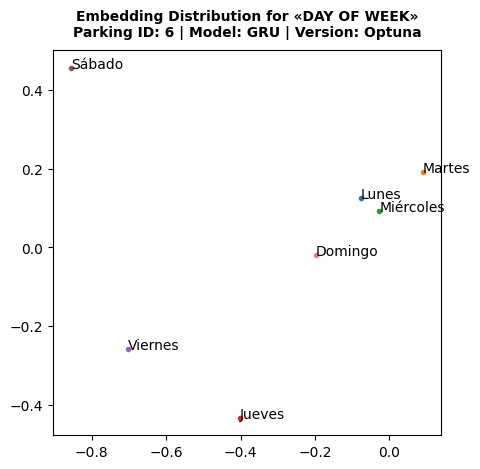

...

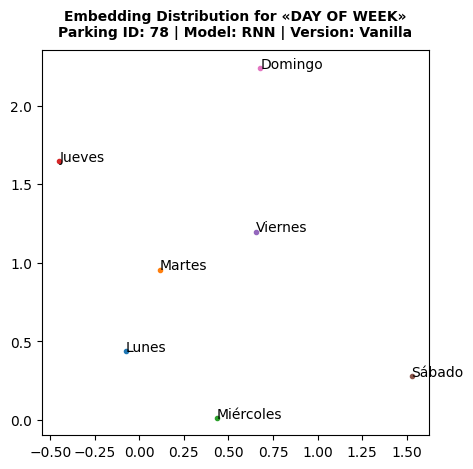

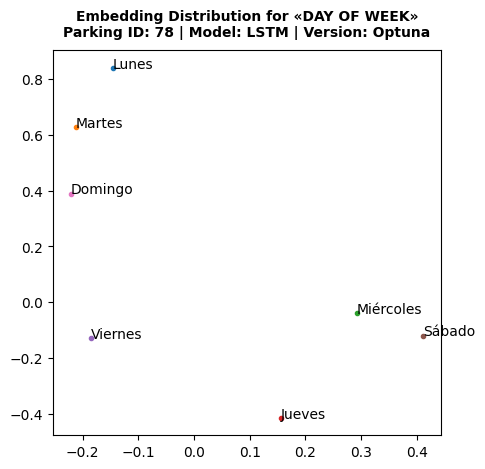

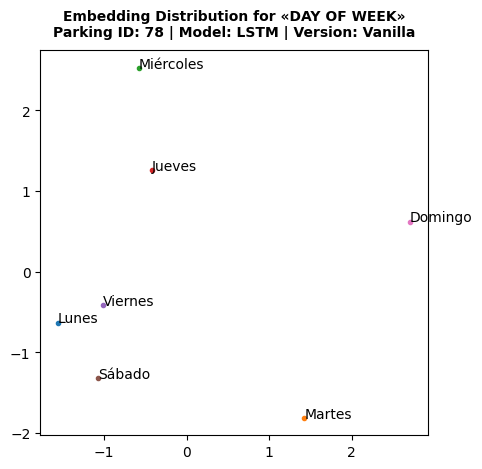

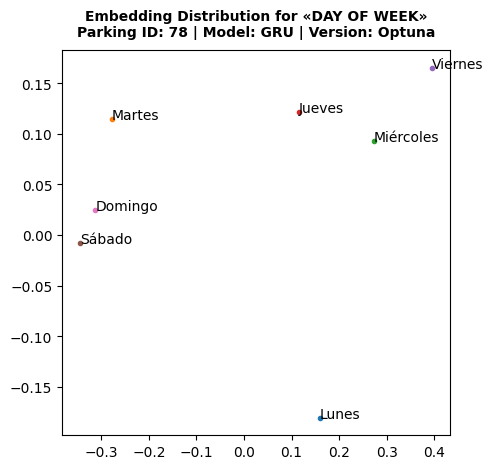

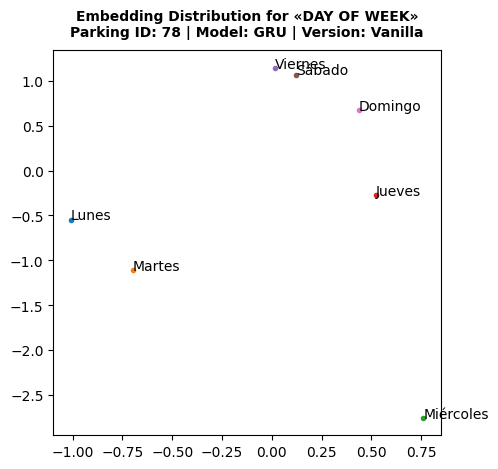

In [20]:
nombres_dias = ["Lunes", "Martes", "Miércoles", "Jueves", "Viernes", "Sábado", "Domingo"]
for pid in list(train.keys()):
    for arch_name in ["rnn", "lstm", "gru"]:
        for tipo in ["optuna", "vanilla"]:
            model_name = f"parking_{pid}_{arch_name}_{tipo}"
            embedding_weekday = models[model_name].embedding_weekday.weight
            plt.figure(figsize=(5,5))
            for i in range(7):
                plt.plot(embedding_weekday[i,0].cpu().detach().numpy(), embedding_weekday[i,1].cpu().detach().numpy(), ".")
                plt.text(embedding_weekday[i,0].cpu().detach().numpy(), embedding_weekday[i,1].cpu().detach().numpy(), nombres_dias[i])
                title_str = (
                    f"Embedding Distribution for «DAY OF WEEK»\n"
                    f"Parking ID: {pid} | Model: {arch_name.upper()} | Version: {tipo.title()}"
                )
                plt.title(title_str, fontsize = 10, fontweight='bold', pad = 10)
            plt.show()

# Modelo subrogado

In [49]:
from sklearn.tree import DecisionTreeRegressor
modelo_subr = DecisionTreeRegressor(max_leaf_nodes=20)

In [ ]:
predictions_dir = os.path.join(TEST_PREDICTIONS_DIR, f"parking_{pid}", arch_name, tipo, "test", "predictions.csv")
predictions = pd.read_csv(predictions_dir)
Y_train = predictions["y_pred"]

,y_true,y_pred
0,0.760776,0.761230
1,0.758621,0.758400
2,0.758621,0.754307
3,0.756466,0.754870
4,0.754310,0.750043
...,...,...
2753,0.765086,0.751268
2754,0.765086,0.747071
2755,0.767241,0.741821
2756,0.762931,0.736497


In [69]:
len(list(test.keys()))

8

In [67]:
for pid in list(test.keys()):
    for arch_name in ["rnn", "lstm", "gru"]:
        for tipo in ["optuna", "vanilla"]:
            X_train = test[pid].drop(columns=["PorcPlazasDisponibles", "timestamp", "idAparcamiento"]).iloc[WINDOW_INPUT_LENGTH:]  
            predictions_dir = os.path.join(TEST_PREDICTIONS_DIR, f"parking_{pid}", arch_name, tipo, "test", "predictions.csv")
            predictions = pd.read_csv(predictions_dir)
            Y_train = predictions["y_pred"]
            modelo_subr.fit(X_train, Y_train)
            score = modelo_subr.score(X_train, Y_train)
            print(f"Parking ID: {pid} | Model: {arch_name.upper()} | Version: {tipo.title()} | Score: {score}" )
            

Parking ID: 6 | Model: RNN | Version: Optuna | Score: 0.9691565130109145
Parking ID: 6 | Model: RNN | Version: Vanilla | Score: 0.9620713816720388
Parking ID: 6 | Model: LSTM | Version: Optuna | Score: 0.9719214952003963
Parking ID: 6 | Model: LSTM | Version: Vanilla | Score: 0.9677892073003656
Parking ID: 6 | Model: GRU | Version: Optuna | Score: 0.9688034294710259
Parking ID: 6 | Model: GRU | Version: Vanilla | Score: 0.966904792064453
Parking ID: 7 | Model: RNN | Version: Optuna | Score: 0.9637652107608864
Parking ID: 7 | Model: RNN | Version: Vanilla | Score: 0.9636718406865679
Parking ID: 7 | Model: LSTM | Version: Optuna | Score: 0.96159275584912
Parking ID: 7 | Model: LSTM | Version: Vanilla | Score: 0.9671087048253452
Parking ID: 7 | Model: GRU | Version: Optuna | Score: 0.963247796202588
Parking ID: 7 | Model: GRU | Version: Vanilla | Score: 0.9628166701762698
Parking ID: 8 | Model: RNN | Version: Optuna | Score: 0.9658063941606423
Parking ID: 8 | Model: RNN | Version: Vanilla

We can that a simple TreeRegressor is able to explain an average of 9

Let´s compute the tree plot in order to see feature importance

Parking ID: 6 | Model: RNN | Version: Optuna | Score: 0.9691565130109145


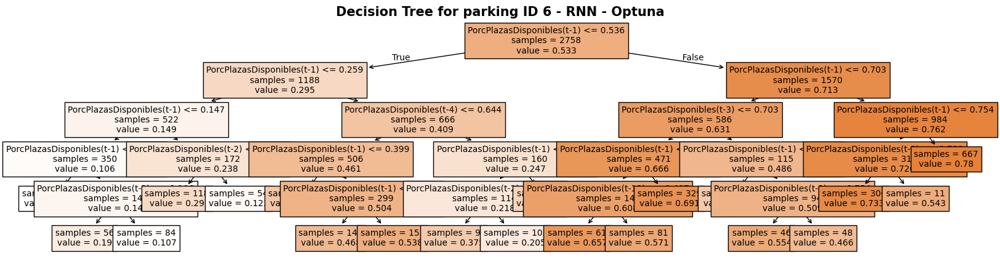

Parking ID: 6 | Model: RNN | Version: Vanilla | Score: 0.9620713816720388


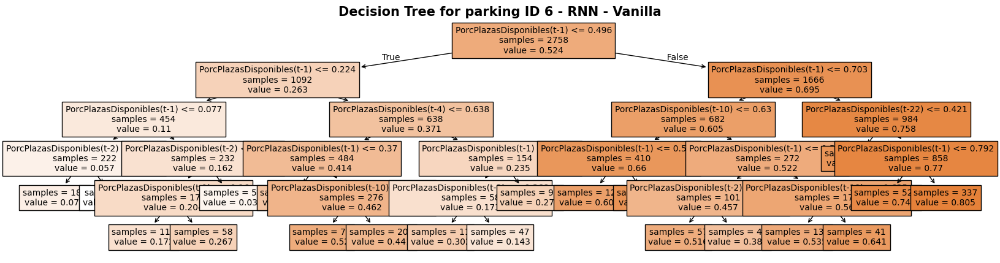

Parking ID: 6 | Model: LSTM | Version: Optuna | Score: 0.9719214952003963


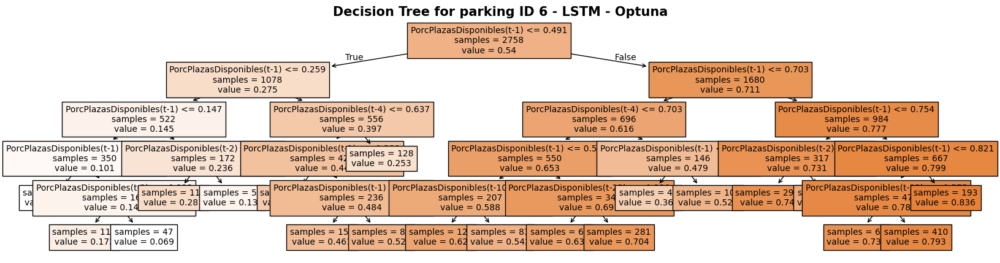

Parking ID: 6 | Model: LSTM | Version: Vanilla | Score: 0.9677892073003656


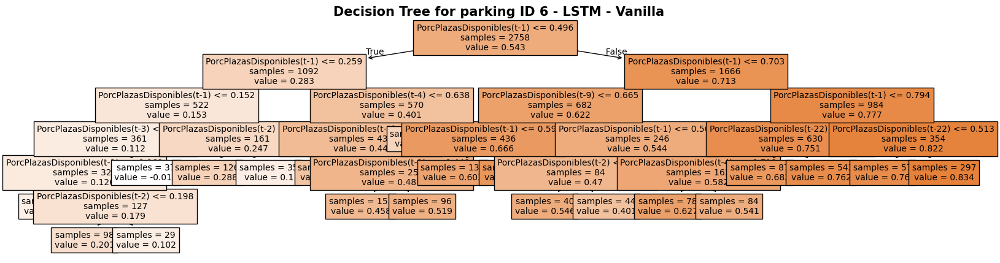

Parking ID: 6 | Model: GRU | Version: Optuna | Score: 0.9688034294710259


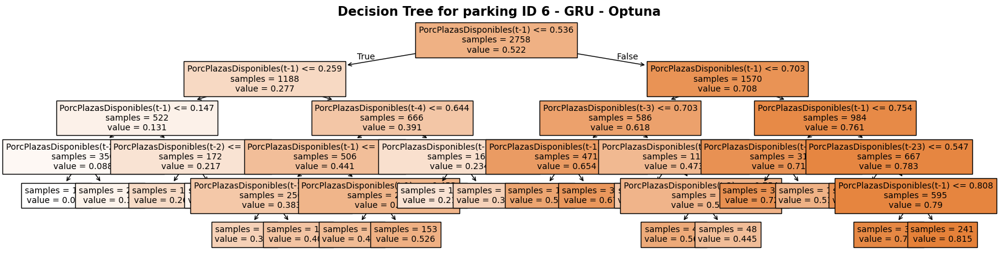

Parking ID: 6 | Model: GRU | Version: Vanilla | Score: 0.966904792064453


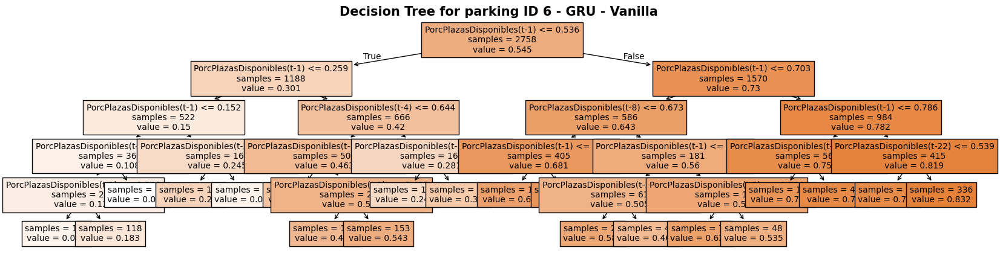

Parking ID: 7 | Model: RNN | Version: Optuna | Score: 0.9637652107608864


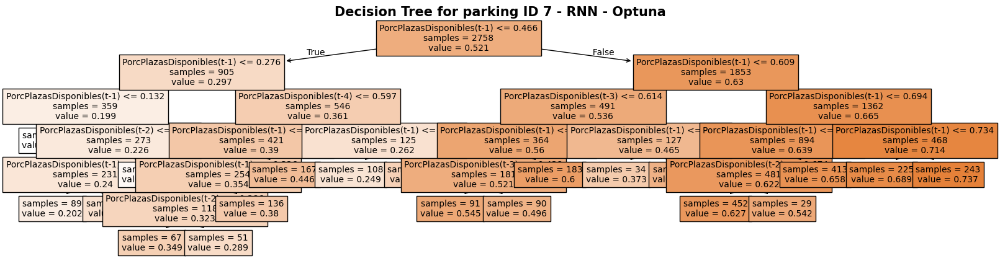

Parking ID: 7 | Model: RNN | Version: Vanilla | Score: 0.9636718406865679


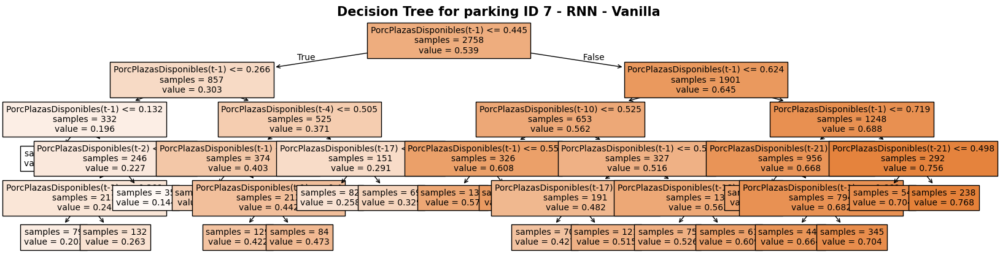

Parking ID: 7 | Model: LSTM | Version: Optuna | Score: 0.96159275584912


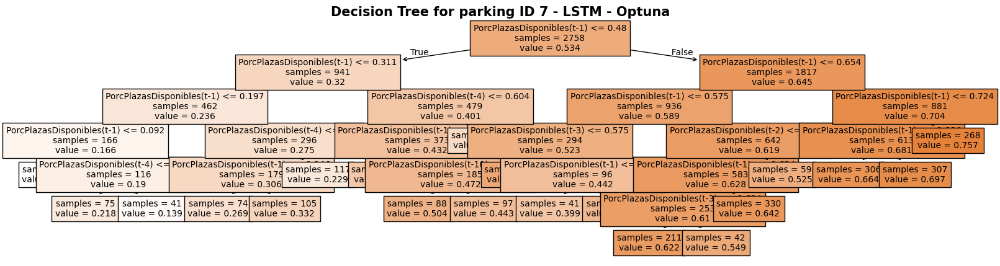

Parking ID: 7 | Model: LSTM | Version: Vanilla | Score: 0.9671087048253452


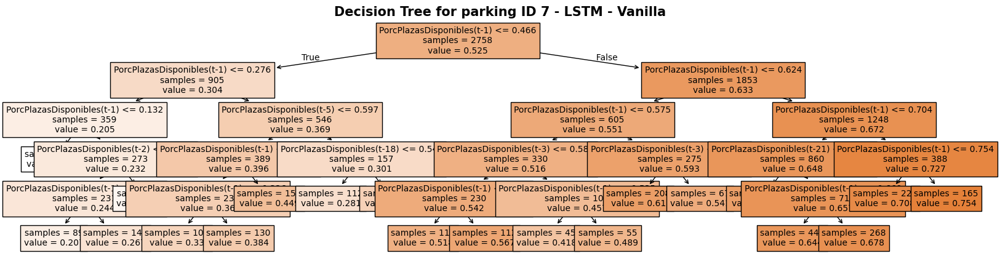

Parking ID: 7 | Model: GRU | Version: Optuna | Score: 0.963247796202588


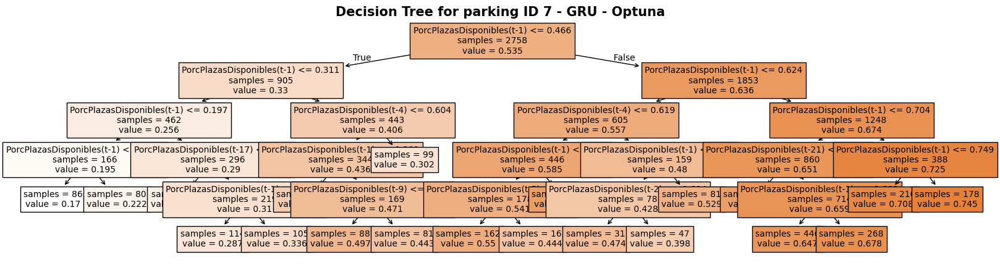

Parking ID: 7 | Model: GRU | Version: Vanilla | Score: 0.9628166701762698


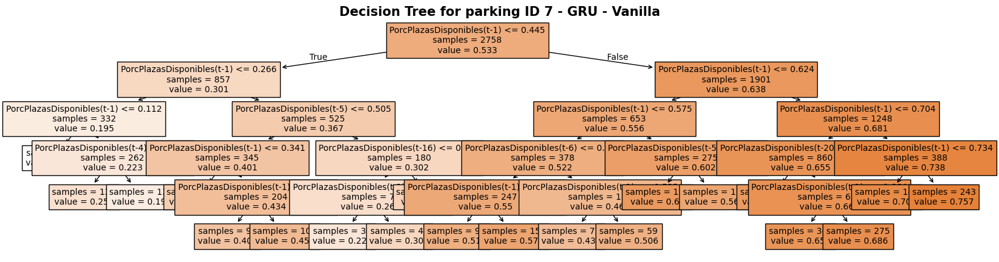

Parking ID: 8 | Model: RNN | Version: Optuna | Score: 0.9658063941606423


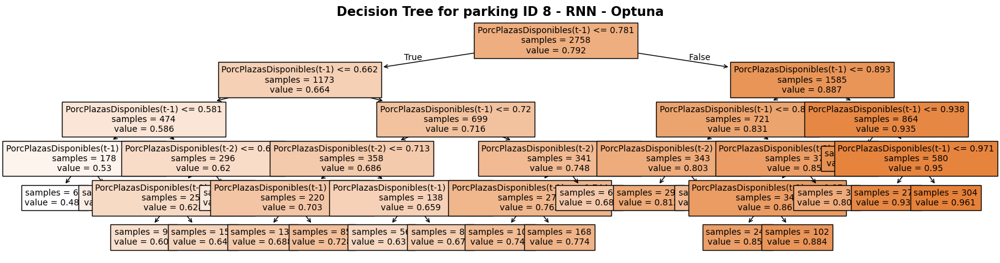

Parking ID: 8 | Model: RNN | Version: Vanilla | Score: 0.9637418391184307


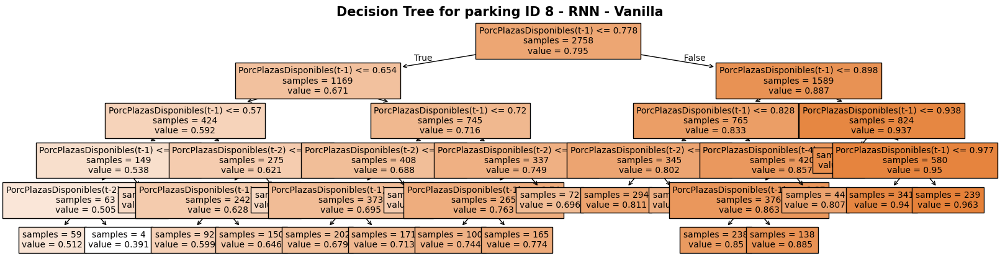

Parking ID: 8 | Model: LSTM | Version: Optuna | Score: 0.9610693619333964


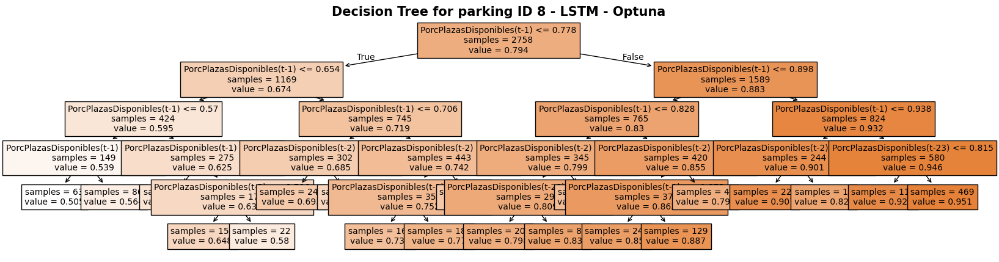

Parking ID: 8 | Model: LSTM | Version: Vanilla | Score: 0.9657953679274345


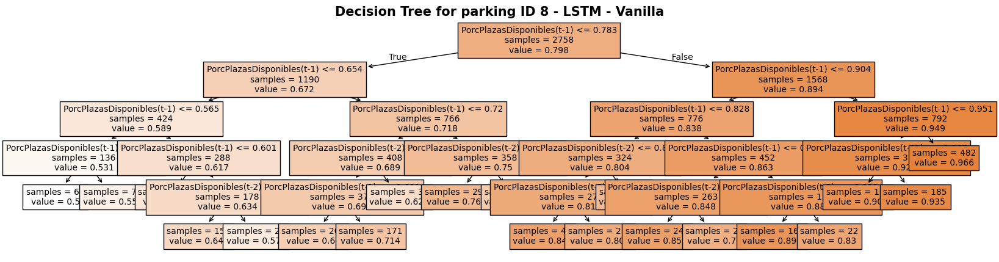

Parking ID: 8 | Model: GRU | Version: Optuna | Score: 0.9521198678857616


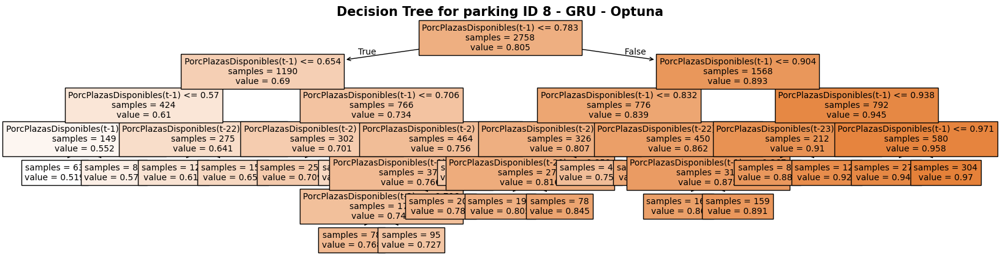

Parking ID: 8 | Model: GRU | Version: Vanilla | Score: 0.965817114799878


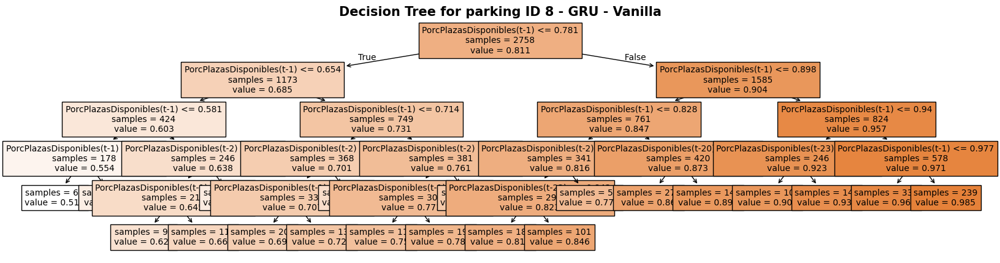

Parking ID: 13 | Model: RNN | Version: Optuna | Score: 0.9614240272004355


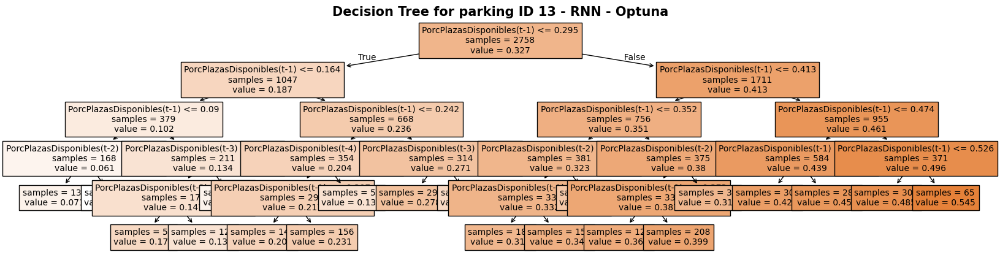

Parking ID: 13 | Model: RNN | Version: Vanilla | Score: 0.964860186501507


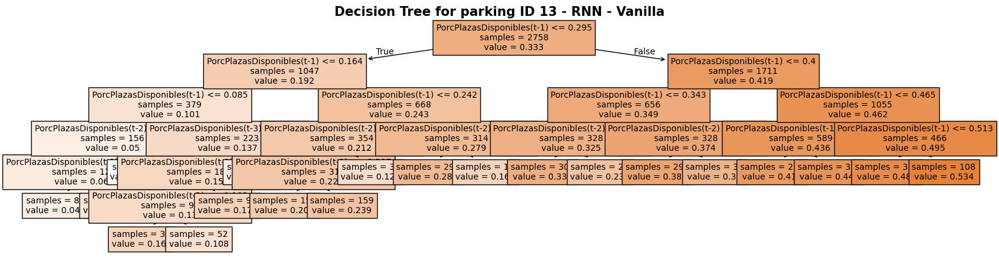

Parking ID: 13 | Model: LSTM | Version: Optuna | Score: 0.9491400066746412


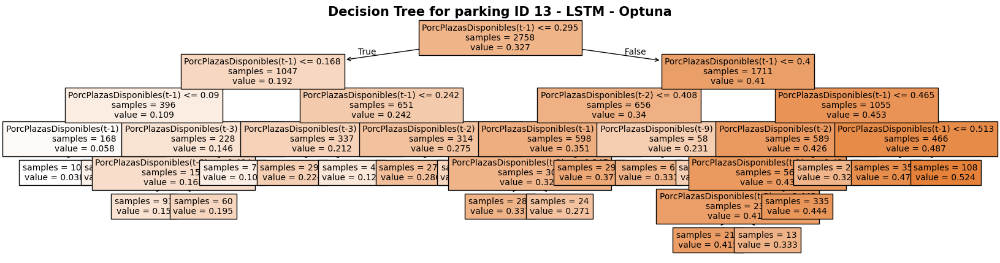

Parking ID: 13 | Model: LSTM | Version: Vanilla | Score: 0.9641988169554535


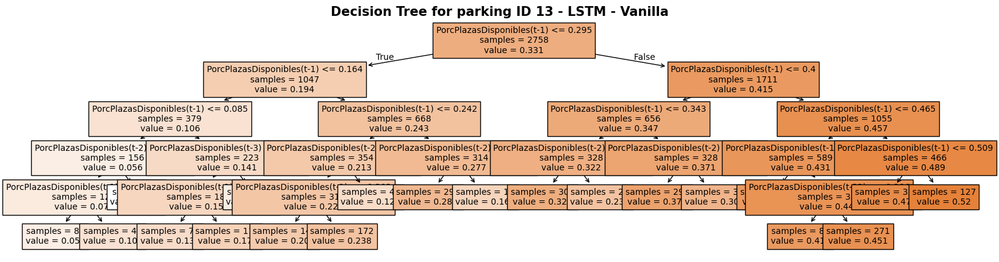

Parking ID: 13 | Model: GRU | Version: Optuna | Score: 0.9420729575527034


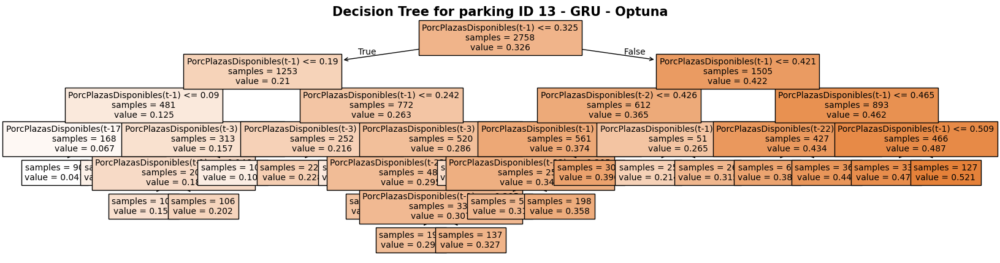

Parking ID: 13 | Model: GRU | Version: Vanilla | Score: 0.9678407298740106


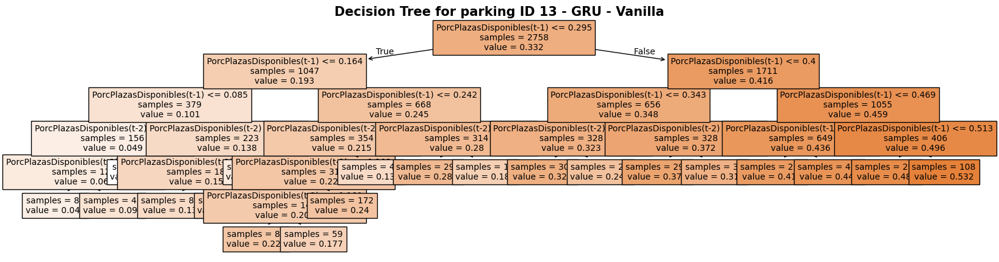

Parking ID: 34 | Model: RNN | Version: Optuna | Score: 0.9747641504641275


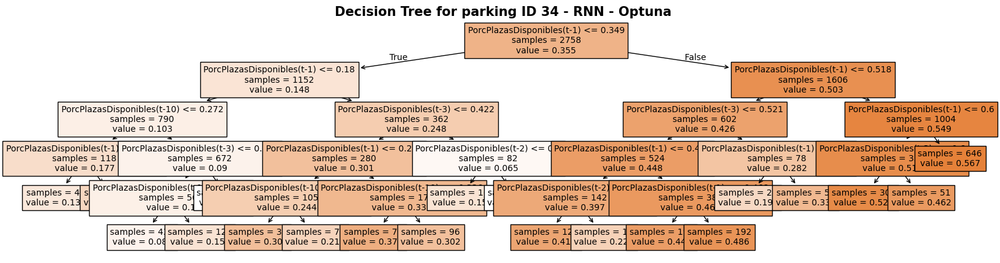

Parking ID: 34 | Model: RNN | Version: Vanilla | Score: 0.9687787892804994


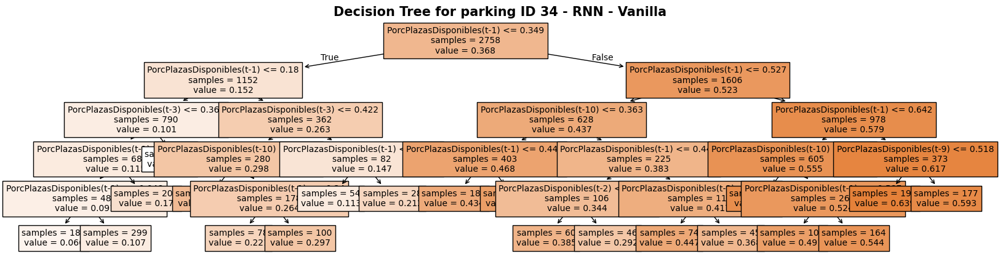

Parking ID: 34 | Model: LSTM | Version: Optuna | Score: 0.9648742698181504


In [ ]:
from sklearn.tree import plot_tree

for pid in list(test.keys()):
    for arch_name in ["rnn", "lstm", "gru"]:
        for tipo in ["optuna", "vanilla"]:
            X_train = test[pid].drop(columns=["PorcPlazasDisponibles", "timestamp", "idAparcamiento"]).iloc[WINDOW_INPUT_LENGTH:]  
            predictions_dir = os.path.join(TEST_PREDICTIONS_DIR, f"parking_{pid}", arch_name, tipo, "test", "predictions.csv")
            predictions = pd.read_csv(predictions_dir)
            Y_train = predictions["y_pred"]
            modelo_subr.fit(X_train, Y_train)
            score = modelo_subr.score(X_train, Y_train)
            print(f"Parking ID: {pid} | Model: {arch_name.upper()} | Version: {tipo.title()} | Score: {score}" )
            plt.figure(figsize=(20,5))
            plot_tree(modelo_subr, feature_names=X_train.columns, filled=True,
                    fontsize=10, impurity=False);
            plt.title(f"Decision Tree for parking ID {pid} - {arch_name.upper()} - {tipo.title()}", fontsize=15, fontweight='bold')
            plt.show()
            #time.sleep(2)